# 美しい地図を作りましょう

<img src="https://raw.githubusercontent.com/yohman/23-1-Reitaku-GIS/main/Weeks/Week09/images/better maps.jpg">

matplotlib を使用してマップを作成する方法を学習しました。 このラボでは、マップ フィーチャの変更、ベースマップの追加、タイトルの作成などにより、これらのマップをさらに磨き上げる方法を学びます。

*注意

matplotlib には日本語フォント表示に関する問題があります。 Mac と PC のどちらを使用しているかに応じて、以下の適切なフォント ファミリを設定してください。

In [1]:
import geopandas as gpd
import contextily as ctx
import plotly.express as px
import matplotlib.pyplot as plt

# set font
import matplotlib as mpl

# for Mac
#mpl.rc('font',family='Hiragino Maru Gothic Pro')

# for PC
mpl.rc('font',family='MS Gothic')


## Get data

まずはe-Statのサイトにアクセス。そこから次に手順でデータをダウンロードして今週のフォルダーに入れる：

➡️ https://www.e-stat.go.jp/

➡️ 地図

➡️ 統計データダウンロード

➡️ 境界データ

➡️ 小地域

➡️ 国勢調査

➡️ 2020年

➡️ 小地域（基本単位区）（JGD2000）

➡️ 世界測地系緯度経度・Shapefile

➡️ 12 千葉県

➡️ 12217 柏市

In [4]:
gdf = gpd.read_file('B002005212020DDSWC12217.zip')

In [5]:
# explore the data
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 6178 entries, 0 to 6177
Data columns (total 38 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   KEY_CODE   6178 non-null   object  
 1   PREF       6178 non-null   object  
 2   CITY       6178 non-null   object  
 3   K_AREA     6178 non-null   object  
 4   S_AREA     6178 non-null   object  
 5   PREF_NAME  6178 non-null   object  
 6   CITY_NAME  6178 non-null   object  
 7   S_NAME     6178 non-null   object  
 8   KIGO_E     2 non-null      object  
 9   HCODE      6178 non-null   int64   
 10  AREA       6178 non-null   float64 
 11  PERIMETER  6178 non-null   float64 
 12  KIHON1     6178 non-null   object  
 13  DUMMY1     6178 non-null   object  
 14  KIHON2     6178 non-null   object  
 15  KIHON3     6178 non-null   object  
 16  C1         6178 non-null   int64   
 17  C2         6178 non-null   int64   
 18  DUMMY2     6178 non-null   object  
 19  C3         6178 non

In [6]:
gdf.head()

,KEY_CODE,PREF,CITY,K_AREA,S_AREA,PREF_NAME,CITY_NAME,S_NAME,KIGO_E,HCODE,...,KEYCODE1,JINKO,SETAI,KEN_OLD,CITY_OLD,X_CODE,Y_CODE,KCODE1,CCODE1,geometry
0,122170001101,12,217,018005060,0001101,千葉県,柏市,柏五丁目,NaN,8101,...,2170001-1-01,29,14,12,217,139.975581,35.865574,0180-05060,1-1- 1,"POLYGON ((139.97627 35.86568, 139.97647 35.865..."
1,122170001102,12,217,018005070,0001102,千葉県,柏市,柏五丁目,NaN,8101,...,2170001-1-02,56,37,12,217,139.975826,35.866425,0180-05070,1-1- 2,"POLYGON ((139.97627 35.86568, 139.97603 35.865..."
2,122170001103,12,217,018005090,0001103,千葉県,柏市,柏五丁目,NaN,8101,...,2170001-1-03,0,0,12,217,139.974888,35.866766,0180-05090,1-1- 3,"POLYGON ((139.97576 35.86743, 139.97553 35.867..."
3,122170001104,12,217,018005100,0001104,千葉県,柏市,柏五丁目,NaN,8101,...,2170001-1-04,0,0,12,217,139.976011,35.868092,0180-05100,1-1- 4,"POLYGON ((139.97692 35.86849, 139.97680 35.868..."
4,122170001105,12,217,018005110,0001105,千葉県,柏市,柏五丁目,NaN,8101,...,2170001-1-05,15,15,12,217,139.977300,35.867969,0180-05110,1-1- 5,"POLYGON ((139.97785 35.86753, 139.97779 35.867..."


このデータを「丁目」でまとめたいのでテーブルの中の丁目を示す「S_NAME」でグループ化してsumします。

In [7]:
# dissolve by S_NAME and sum fields 
gdf = gdf.dissolve(by='S_NAME',aggfunc='sum').reset_index()

In [8]:
gdf.head()

,S_NAME,geometry,KEY_CODE,PREF,CITY,K_AREA,S_AREA,PREF_NAME,CITY_NAME,KIGO_E,...,KIGO_I,KEYCODE1,JINKO,SETAI,KEN_OLD,CITY_OLD,X_CODE,Y_CODE,KCODE1,CCODE1
0,あかね町,"POLYGON ((139.97721 35.84821, 139.97718 35.848...",1221707041122170705812217070610112217070610212...,1212121212121212121212121212121212121212121212...,2172172172172172172172172172172172172172172172...,0020001000020001000020000900020000800020000800...,0704107058070610107061020707107081070910710101...,千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県千...,柏市柏市柏市柏市柏市柏市柏市柏市柏市柏市柏市柏市柏市柏市柏市柏市柏市柏市柏市柏市柏市柏市柏市...,0,...,0.0,2170704-1-002170705-8-002170706-1-012170706-1-...,2596,1160,1212121212121212121212121212121212121212121212...,2172172172172172172172172172172172172172172172...,5039.213549,1290.620115,0020-001000020-001000020-000900020-000800020-0...,704-1705-8706-1- 1706-1- 2707-1708-1709-1710-1...
1,あけぼの一丁目,"POLYGON ((139.97299 35.86487, 139.97262 35.865...",1221703801011221703801021221703811122170382112...,121212121212121212,217217217217217217217217217,0040010500040010400040010300040010300040010100...,0380101038010203811038210383101038310203841038...,千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県,柏市柏市柏市柏市柏市柏市柏市柏市柏市,0,...,0.0,2170380-1-012170380-1-022170381-1-002170382-1-...,835,537,121212121212121212,217217217217217217217217217,1259.744434,322.794984,0040-010500040-010400040-010300040-010300040-0...,380-1- 1380-1- 2381-1382-1383-1- 1383-1- 2384-...
2,あけぼの三丁目,"POLYGON ((139.97113 35.86752, 139.97113 35.867...",1221704221011221704221021221704231122170433112...,12121212121212121212121212,217217217217217217217217217217217217217,0040031000040031100040030800040030700040030800...,0422101042210204231043310434104351043610437104...,千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県,柏市柏市柏市柏市柏市柏市柏市柏市柏市柏市柏市柏市柏市,0,...,0.0,2170422-1-012170422-1-022170423-1-002170433-1-...,1296,654,12121212121212121212121212,217217217217217217217217217217217217217,1819.633741,466.301609,0040-031000040-031100040-030800040-030700040-0...,422-1- 1422-1- 2423-1433-1434-1435-1436-1437-1...
3,あけぼの二丁目,"POLYGON ((139.97367 35.86611, 139.97333 35.866...",1221704411011221704411021221704421122170443101...,1212121212121212121212121212,217217217217217217217217217217217217217217,0040020300040020400040020200040020100040020200...,0441101044110204421044310104431020444101044410...,千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県,柏市柏市柏市柏市柏市柏市柏市柏市柏市柏市柏市柏市柏市柏市,0,...,0.0,2170441-1-012170441-1-022170442-1-002170443-1-...,1295,721,1212121212121212121212121212,217217217217217217217217217217217217217217,1959.642514,502.153552,0040-020300040-020400040-020200040-020100040-0...,441-1- 1441-1- 2442-1443-1- 1443-1- 2444-1- 14...
4,あけぼの五丁目,"POLYGON ((139.97036 35.86862, 139.97057 35.867...",1221704241011221704241021221704251122170426112...,12121212121212121212,217217217217217217217217217217,0040050400040050500040050400040050400040050400...,0424101042410204251042610427104281042910430104...,千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県千葉県,柏市柏市柏市柏市柏市柏市柏市柏市柏市柏市,0,...,0.0,2170424-1-012170424-1-022170425-1-002170426-1-...,1472,645,12121212121212121212,217217217217217217217217217217,1399.682118,358.691626,0040-050400040-050500040-050400040-050400040-0...,424-1- 1424-1- 2425-1426-1427-1428-1429-1430-1...


ではとりあえずシンプルにマップを`fig,ax`という変数を使って作ろう。このアプローチはmatplotlibでよく使われ、複数のマップを同時に作りたい時に後々役に立ちます。今のうちに覚えておくと良い！

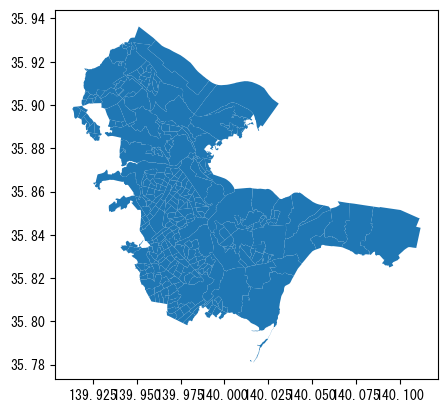

In [9]:
fig,ax = plt.subplots()
gdf.plot(ax=ax);

データには既に「JINKO」のカラムがあるので、これを使ってコロプレス（choropleth）マップを作ろう。
- `column='JINKO'`
- `legend=True`

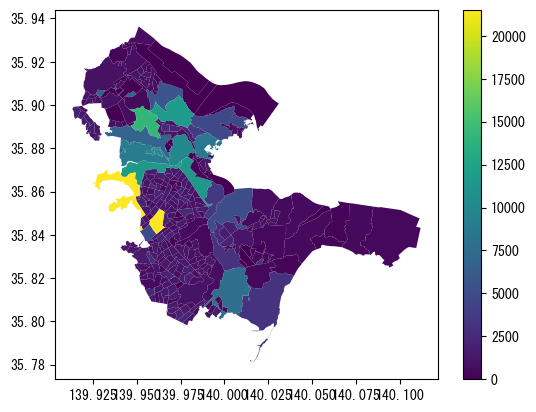

In [10]:
# population map
fig,ax = plt.subplots()
gdf.plot(ax=ax,
         column='JINKO',
         legend=True);

## Size

マップのサイズを変更
- `figsize=(10,10)`

2 つの数字はマップの幅と高さを示しますが、マップされるデータの形状に応じてサイズが変化する可能性があります。

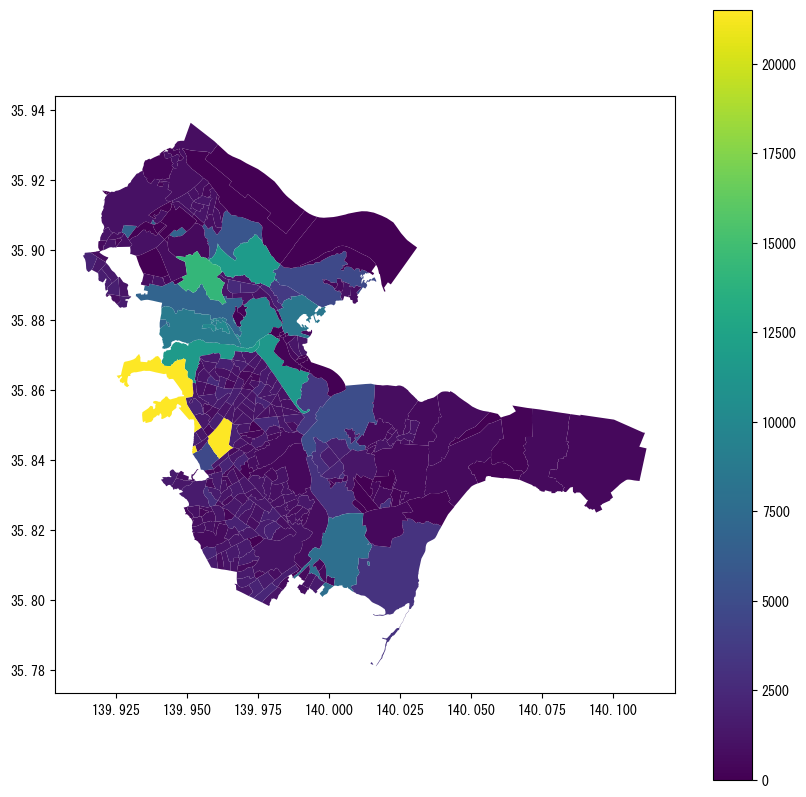

In [11]:
# population map
fig,ax = plt.subplots(figsize=(10,10))
gdf.plot(ax=ax,
         column='JINKO',
         legend=True);

## Color

`cmap` 引数を設定して、次の選択肢からコロプレス マップのカラー パレットを割り当てることができます。なお、色の方向を変えるには `_r` を付け加えればいい。

例：　
- `cmap='autumn'`
- `cmap='autumn_r'`

<img src="https://raw.githubusercontent.com/yohman/23-1-Reitaku-GIS/main/Weeks/Week09/images/sphx_glr_colormaps_002.webp">
<img src="https://raw.githubusercontent.com/yohman/23-1-Reitaku-GIS/main/Weeks/Week09/images/sphx_glr_colormaps_003.webp">
<img src="https://raw.githubusercontent.com/yohman/23-1-Reitaku-GIS/main/Weeks/Week09/images/sphx_glr_colormaps_004.webp">

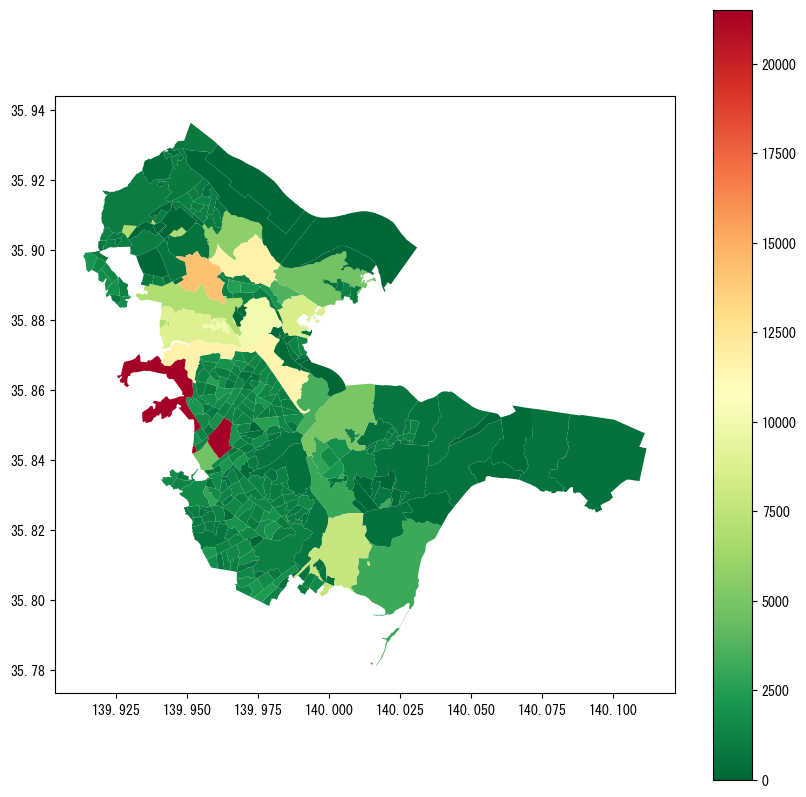

In [12]:
# population map
fig,ax = plt.subplots(figsize=(10,10))
gdf.plot(ax=ax,
         column='JINKO',
         legend=True,
         cmap='RdYlGn_r');

## Lines

次の引数を使用して、ポリゴンの境界線の幅と色を変更できます。

- `edgecolor='black'`
- `linewidth=0.1`

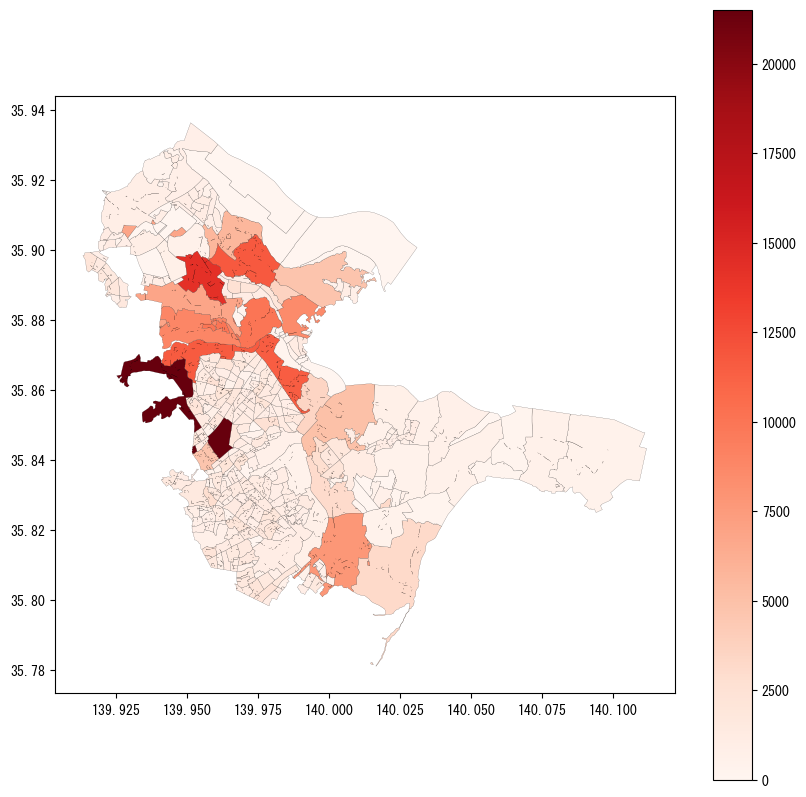

In [13]:
# population map
fig,ax = plt.subplots(figsize=(10,10))
gdf.plot(ax=ax,
         column='JINKO',
         legend=True,
         cmap='Reds',
         edgecolor='black',
         linewidth=0.1);

## Hide Axes

軸を非表示にするには、コード内に新しい行を作成し、`ax` 変数にアクセスする必要があります。

- `ax.axis('off')`


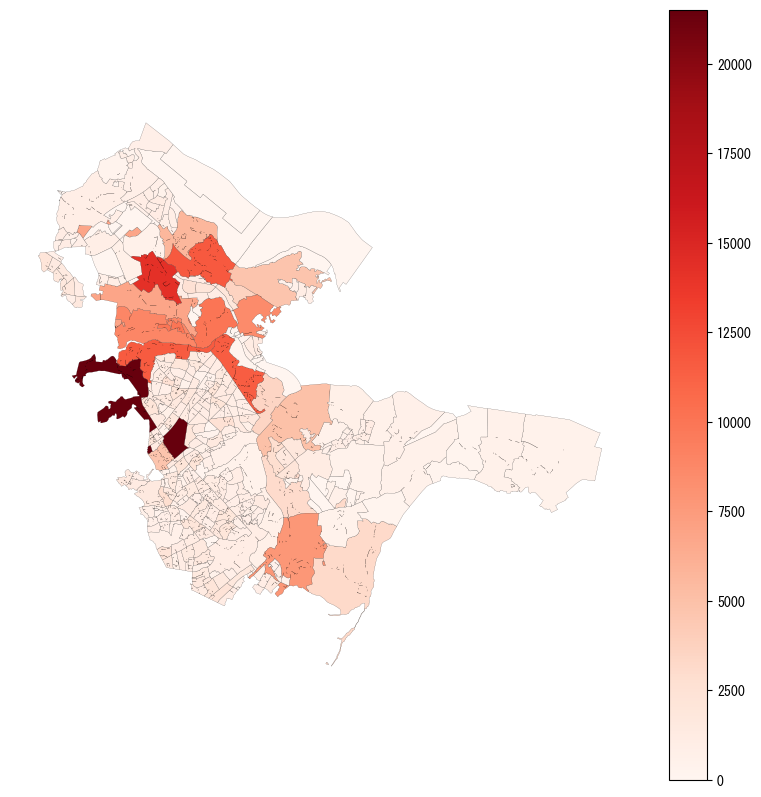

In [14]:
# population map
fig,ax = plt.subplots(figsize=(10,10))
gdf.plot(ax=ax,
         column='JINKO',
         legend=True,
         cmap='Reds',
         edgecolor='black',
         linewidth=0.1);

# hide axes
ax.axis('off');

## Legend options

凡例、デカくない？ラベルは？下にできない？と思ったら、オプションを足してみよう！

- `legend_kwds={'label': "人口数",'shrink': 0.5, 'orientation': "horizontal", 'pad': 0.01}`


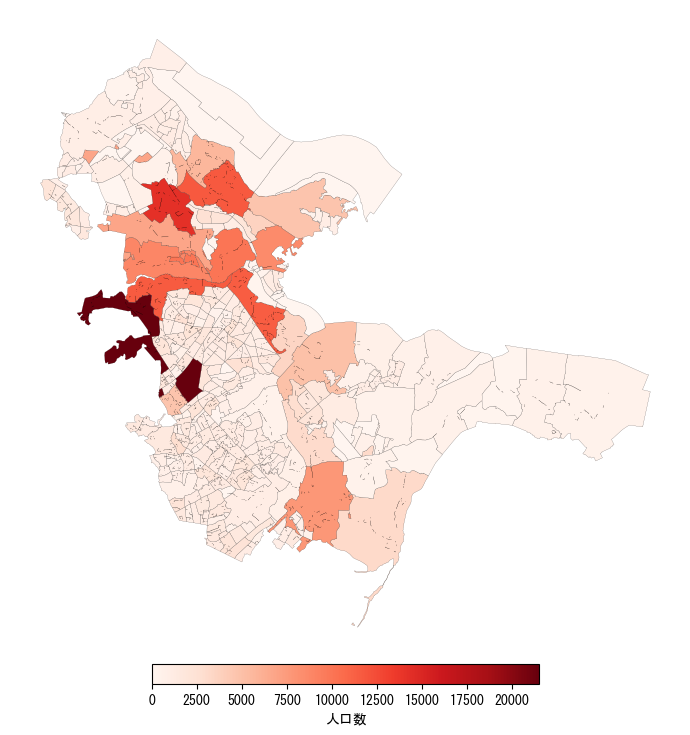

In [15]:
# population map
fig,ax = plt.subplots(figsize=(10,10))
gdf.plot(ax=ax,
         column='JINKO',
         legend=True,
         cmap='Reds',
         edgecolor='black',
         linewidth=0.1,
         legend_kwds={'label': "人口数",'shrink': 0.5, 'orientation': "horizontal", 'pad': 0.01}
         )

# hide axes
ax.axis('off');

## Title

マップのタイトルを設定するには、`ax` 変数を参照する別のコード行を追加する必要があります。

なお、日本語フォントの設定する必要があるのでMACかPCによって違うので注意：

Windows PC:
- `ax.set_title('柏市の人口',fontsize=24, fontname='MS Gothic');`

Mac:
- `ax.set_title('柏市の人口',fontsize=24, fontname='Hiragino Maru Gothic Pro');`

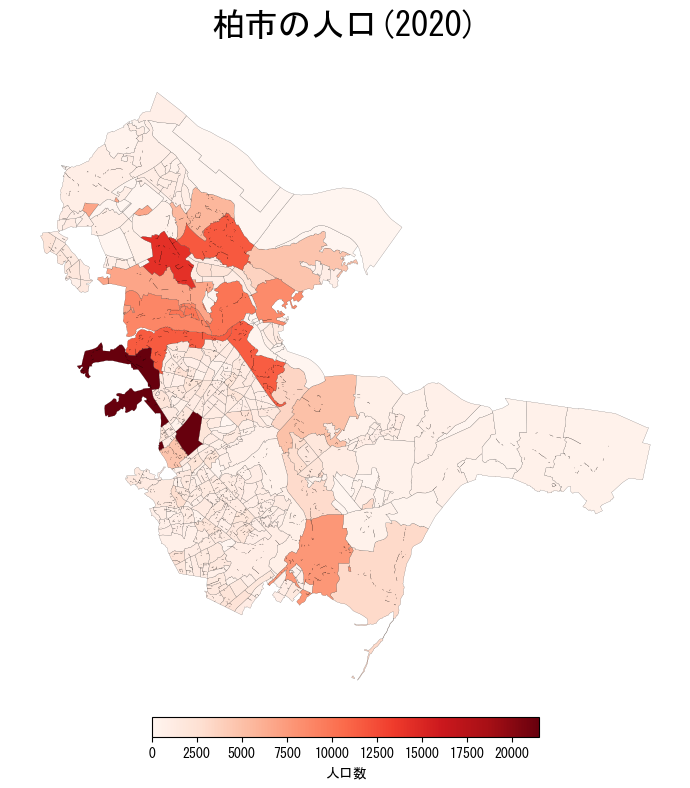

In [16]:
# population map
fig,ax = plt.subplots(figsize=(10,10))
gdf.plot(ax=ax,
         column='JINKO',
         legend=True,
         cmap='Reds',
         edgecolor='black',
         linewidth=0.1,
         legend_kwds={'label': "人口数",'shrink': 0.5, 'orientation': "horizontal", 'pad': 0.01}
         )

# hide axes
ax.axis('off')

# title
ax.set_title('柏市の人口(2020)',fontsize=24, pad=20);

## Basemap

ベースマップを足すには複数のステップが必要となる。

まずはベースマップを提供しているモジュール【contextily】をimportする。

In [17]:
import contextily as cx

次はデータをcontextilyがサポートしている地図投影法に変換する必要がある。

え？地図投影法とは？

## Projections

<img src="https://raw.githubusercontent.com/yohman/23-1-Reitaku-GIS/main/Weeks/Week09/images/projections.png">

https://www.esrij.com/gis-guide/coordinate-and-spatial/coordinate-system/


https://ja.wikipedia.org/wiki/%E5%9C%B0%E5%9B%B3%E6%8A%95%E5%BD%B1%E6%B3%95%E3%81%AE%E4%B8%80%E8%A6%A7

緯度経度 (latitude,longitude) で表されているデータの地理座標系のcrs番号は `4326`だがcontextilyのベースマップは【Web メルカトル】という投影座標系を使っていて、その crs番号は `3857` である。

In [18]:
# change projection for your data to match basemap
gdf=gdf.to_crs(3857)

## Basemap options

<img src="https://raw.githubusercontent.com/yohman/23-1-Reitaku-GIS/main/Weeks/Week09/images/basemaps.jpg">

- source='https://cyberjapandata.gsi.go.jp/xyz/std/{z}/{x}/{y}.png'
- source='https://cyberjapandata.gsi.go.jp/xyz/seamlessphoto/{z}/{x}/{y}.jpg'
- source='https://cyberjapandata.gsi.go.jp/xyz/pale/{z}/{x}/{y}.png'
- source='https://cyberjapandata.gsi.go.jp/xyz/blank/{z}/{x}/{y}.png'


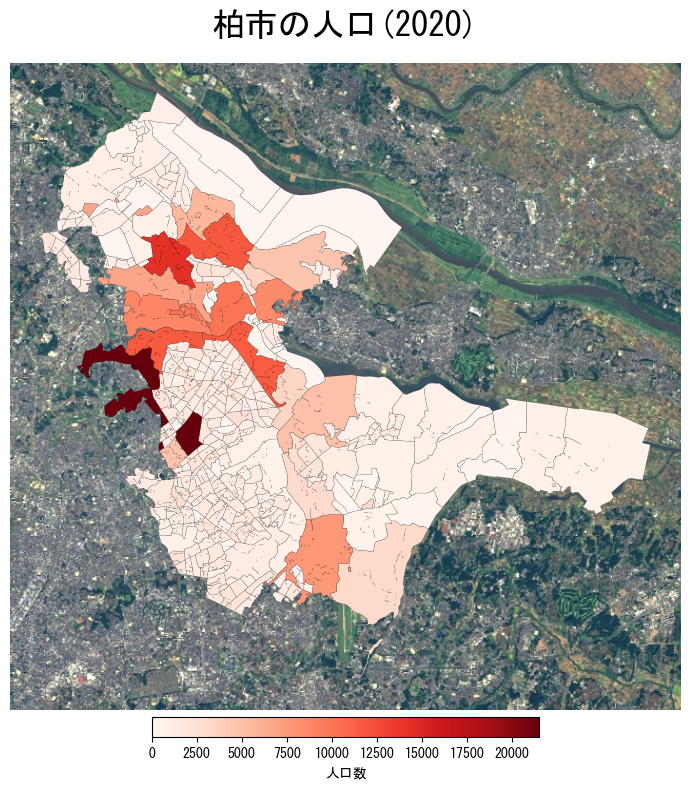

In [19]:
# population map
fig,ax = plt.subplots(figsize=(10,10))

gdf.plot(ax=ax,
         column='JINKO',
         legend=True,
         cmap='Reds',
         edgecolor='black',
         linewidth=0.1,
         legend_kwds={'label': "人口数",'shrink': 0.5, 'orientation': "horizontal", 'pad': 0.01}
         )

# hide axes
ax.axis('off')

# title
ax.set_title('柏市の人口(2020)',fontsize=24, pad=20)

# Add the basemap
ctx.add_basemap(ax, source='https://cyberjapandata.gsi.go.jp/xyz/seamlessphoto/{z}/{x}/{y}.jpg');

## Transparency

コロプレス レイヤーに少し透明度を追加して、ベースマップ上にシームレスに「浮かせる」ことができます。

- `alpha=0.8`

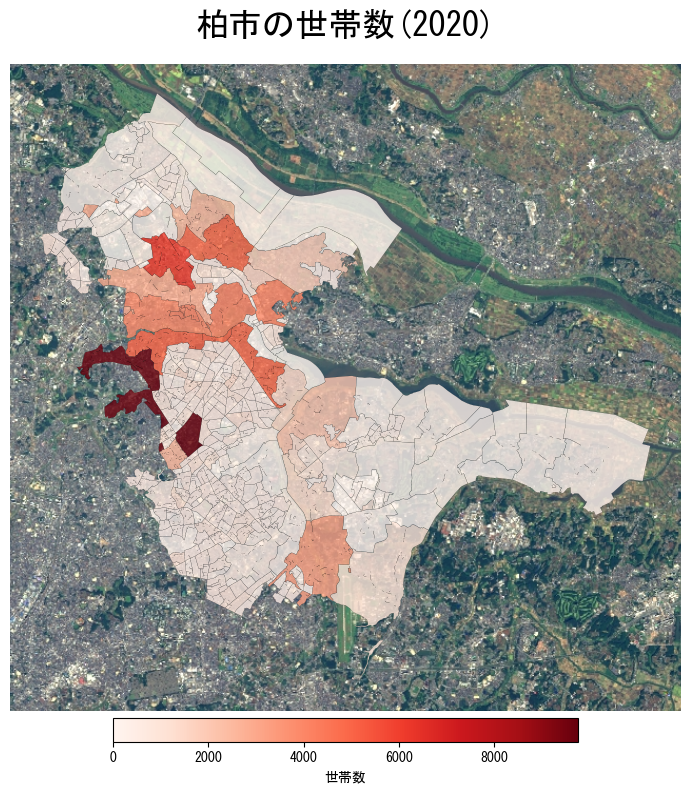

In [25]:
# population map
fig, ax = plt.subplots(figsize=(10,10))

gdf.plot(ax=ax,
         column='SETAI',
         legend=True,
         cmap='Reds',
         edgecolor='black',
         linewidth=0.1,
         alpha=0.8,
         legend_kwds={'label': "世帯数",'shrink': 0.6, 'orientation': "horizontal", 'pad': 0.01}
         )

# hide axes
ax.axis('off')

# title
ax.set_title('柏市の世帯数(2020)', fontsize=24,pad=20)

# Add the basemap
ctx.add_basemap(ax, source='https://cyberjapandata.gsi.go.jp/xyz/seamlessphoto/{z}/{x}/{y}.jpg')


## Labels

ちょっと高度なテクニックだが、以下のようにトップ１０人口が高い場所のラベルをつける。

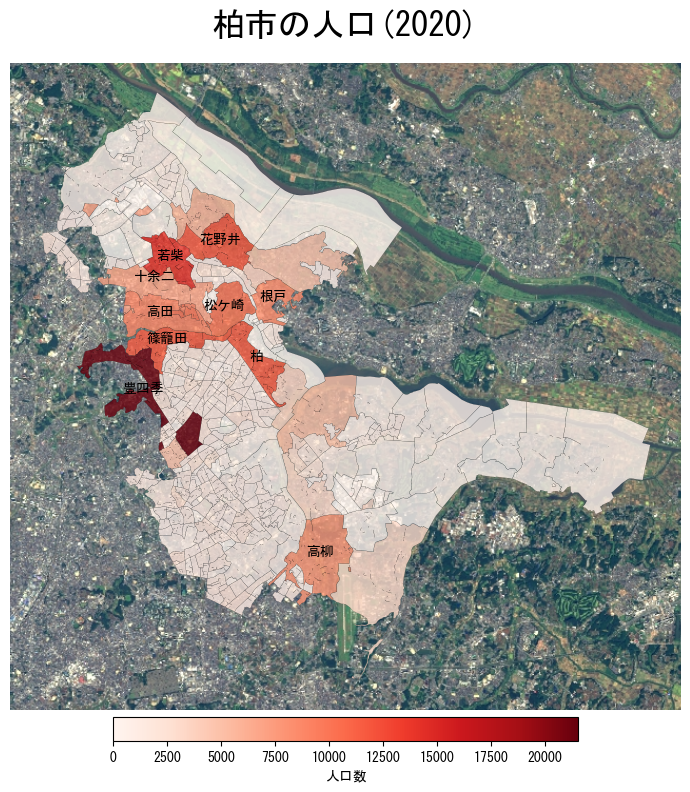

In [21]:
# population map
fig, ax = plt.subplots(figsize=(10,10))

gdf.plot(ax=ax,
         column='JINKO',
         legend=True,
         cmap='Reds',
         edgecolor='black',
         linewidth=0.1,
         alpha=0.8,
         legend_kwds={'label': "人口数",'shrink': 0.6, 'orientation': "horizontal", 'pad': 0.01}
         )

# hide axes
ax.axis('off')

# Sort the dataframe by JINKO in descending order
gdf_sorted = gdf.sort_values('JINKO', ascending=False)

# Get the top 10 rows
top_10 = gdf_sorted.head(10)

# Label the polygons with the top 10 highest JINKO values
for idx, row in top_10.iterrows():
    ax.annotate(row['S_NAME'], (row.geometry.centroid.x, row.geometry.centroid.y), color='black', fontsize=10, ha='center')

# title
ax.set_title('柏市の人口(2020)', fontsize=24,pad=20)

# Add the basemap
ctx.add_basemap(ax, source='https://cyberjapandata.gsi.go.jp/xyz/seamlessphoto/{z}/{x}/{y}.jpg')


# Exercise

「SETAI」を示す地図を作成しましょう。 それに応じてタイトルを変更してください。 マップのさまざまな色を試してください。

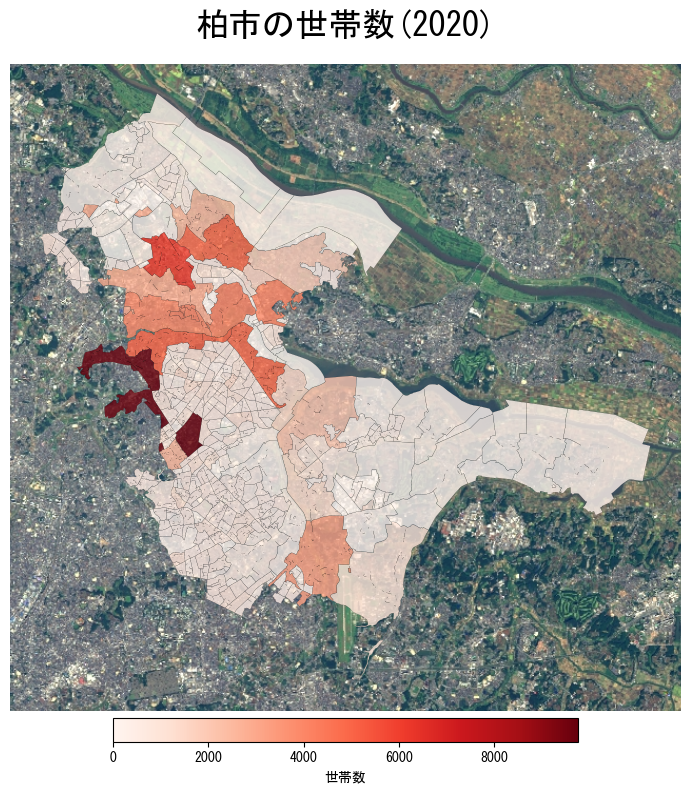

In [26]:
# population map
fig, ax = plt.subplots(figsize=(10,10))

gdf.plot(ax=ax,
         column='SETAI',
         legend=True,
         cmap='Reds',
         edgecolor='black',
         linewidth=0.1,
         alpha=0.8,
         legend_kwds={'label': "世帯数",'shrink': 0.6, 'orientation': "horizontal", 'pad': 0.01}
         )

# hide axes
ax.axis('off')

# title
ax.set_title('柏市の世帯数(2020)', fontsize=24,pad=20)

# Add the basemap
ctx.add_basemap(ax, source='https://cyberjapandata.gsi.go.jp/xyz/seamlessphoto/{z}/{x}/{y}.jpg')


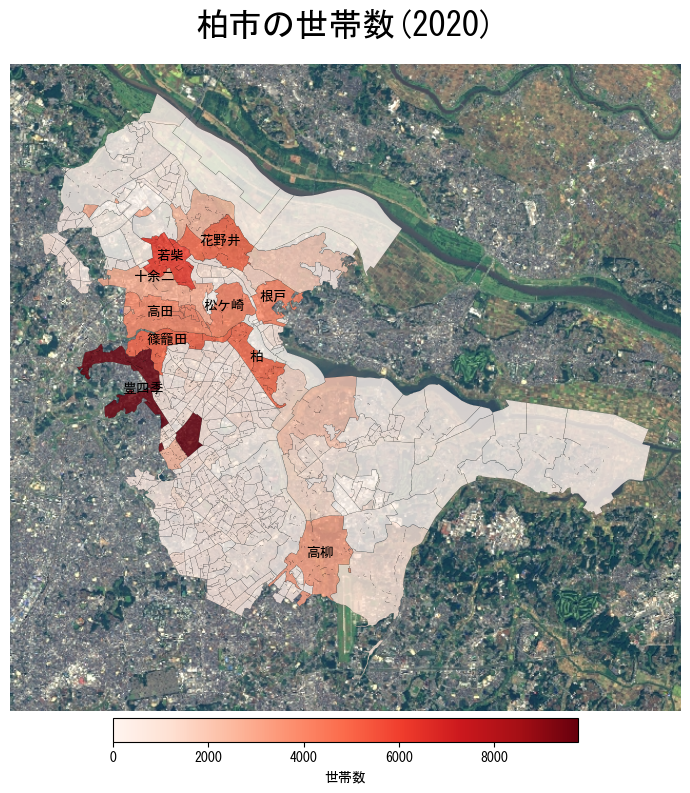

In [27]:
# population map
fig, ax = plt.subplots(figsize=(10,10))

gdf.plot(ax=ax,
         column='SETAI',
         legend=True,
         cmap='Reds',
         edgecolor='black',
         linewidth=0.1,
         alpha=0.8,
         legend_kwds={'label': "世帯数",'shrink': 0.6, 'orientation': "horizontal", 'pad': 0.01}
         )

# hide axes
ax.axis('off')

# Sort the dataframe by JINKO in descending order
gdf_sorted = gdf.sort_values('SETAI', ascending=False)

# Get the top 10 rows
top_10 = gdf_sorted.head(10)

# Label the polygons with the top 10 highest JINKO values
for idx, row in top_10.iterrows():
    ax.annotate(row['S_NAME'], (row.geometry.centroid.x, row.geometry.centroid.y), color='black', fontsize=10, ha='center')

# title
ax.set_title('柏市の世帯数(2020)', fontsize=24,pad=20)

# Add the basemap
ctx.add_basemap(ax, source='https://cyberjapandata.gsi.go.jp/xyz/seamlessphoto/{z}/{x}/{y}.jpg')


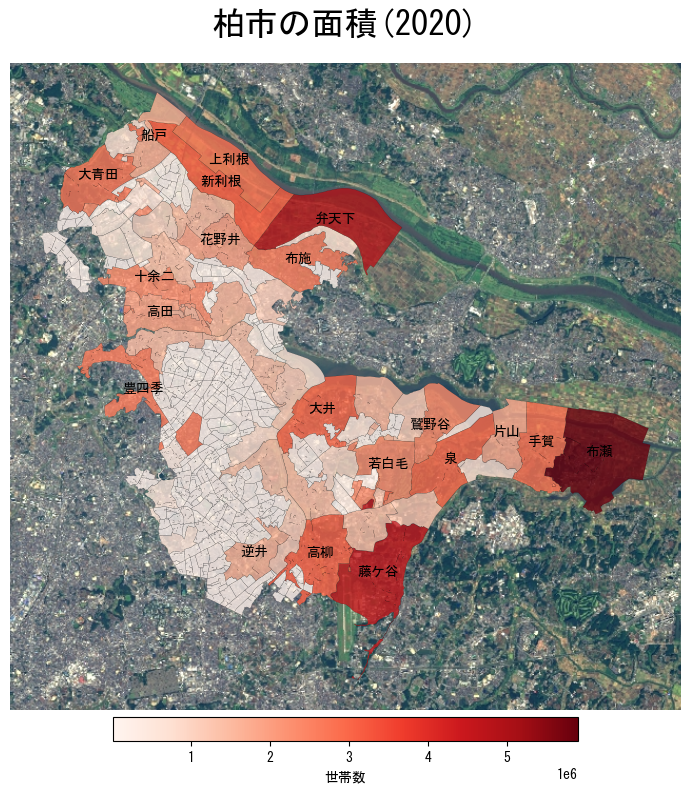

In [28]:
# population map
fig, ax = plt.subplots(figsize=(10,10))

gdf.plot(ax=ax,
         column='AREA',
         legend=True,
         cmap='Reds',
         edgecolor='black',
         linewidth=0.1,
         alpha=0.8,
         legend_kwds={'label': "世帯数",'shrink': 0.6, 'orientation': "horizontal", 'pad': 0.01}
         )

# hide axes
ax.axis('off')

# Sort the dataframe by JINKO in descending order
gdf_sorted = gdf.sort_values('AREA', ascending=False)

# Get the top 10 rows
top_10 = gdf_sorted.head(20)

# Label the polygons with the top 10 highest JINKO values
for idx, row in top_10.iterrows():
    ax.annotate(row['S_NAME'], (row.geometry.centroid.x, row.geometry.centroid.y), color='black', fontsize=10, ha='center')

# title
ax.set_title('柏市の面積(2020)', fontsize=24,pad=20)

# Add the basemap
ctx.add_basemap(ax, source='https://cyberjapandata.gsi.go.jp/xyz/seamlessphoto/{z}/{x}/{y}.jpg')


In [34]:
nise = gpd.read_file('B002005212020DDSWC01395.zip')

In [35]:
nise.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 83 entries, 0 to 82
Data columns (total 38 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   KEY_CODE   83 non-null     object  
 1   PREF       83 non-null     object  
 2   CITY       83 non-null     object  
 3   K_AREA     83 non-null     object  
 4   S_AREA     83 non-null     object  
 5   PREF_NAME  83 non-null     object  
 6   CITY_NAME  83 non-null     object  
 7   S_NAME     83 non-null     object  
 8   KIGO_E     0 non-null      float64 
 9   HCODE      83 non-null     int64   
 10  AREA       83 non-null     float64 
 11  PERIMETER  83 non-null     float64 
 12  KIHON1     83 non-null     object  
 13  DUMMY1     83 non-null     object  
 14  KIHON2     83 non-null     object  
 15  KIHON3     83 non-null     object  
 16  C1         83 non-null     int64   
 17  C2         83 non-null     int64   
 18  DUMMY2     83 non-null     object  
 19  C3         83 non-null 

In [36]:
nise.head()

,KEY_CODE,PREF,CITY,K_AREA,S_AREA,PREF_NAME,CITY_NAME,S_NAME,KIGO_E,HCODE,...,KEYCODE1,JINKO,SETAI,KEN_OLD,CITY_OLD,X_CODE,Y_CODE,KCODE1,CCODE1,geometry
0,013950001101,01,395,003000010,0001101,北海道,ニセコ町,字中央通,NaN,8101,...,3950001-1-01,20,12,01,395,140.678621,42.806450,0030-00010,1-1- 1,"POLYGON ((140.68712 42.81037, 140.68670 42.810..."
1,013950001102,01,395,003000020,0001102,北海道,ニセコ町,字中央通,NaN,8101,...,3950001-1-02,39,24,01,395,140.687343,42.810953,0030-00020,1-1- 2,"POLYGON ((140.68977 42.81134, 140.68992 42.810..."
2,013950001103,01,395,003000030,0001103,北海道,ニセコ町,字中央通,NaN,8101,...,3950001-1-03,58,29,01,395,140.688247,42.808796,0030-00030,1-1- 3,"POLYGON ((140.68992 42.81090, 140.69051 42.809..."
3,013950001104,01,395,003000040,0001104,北海道,ニセコ町,字中央通,NaN,8101,...,3950001-1-04,4,3,01,395,140.686478,42.807247,0030-00040,1-1- 4,"POLYGON ((140.68667 42.80689, 140.68642 42.806..."
4,013950002101,01,395,001000010,0002101,北海道,ニセコ町,字本通,NaN,8101,...,3950002-1-01,52,31,01,395,140.680934,42.804630,0010-00010,2-1- 1,"POLYGON ((140.68154 42.80550, 140.68179 42.804..."


In [37]:
# dissolve by S_NAME and sum fields 
nise = nise.dissolve(by='S_NAME',aggfunc='sum').reset_index()

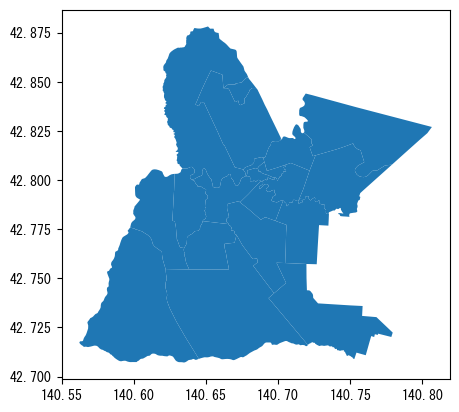

In [38]:
fig,ax = plt.subplots()
nise.plot(ax=ax);

In [40]:
# change projection for your data to match basemap
nise=nise.to_crs(3857)

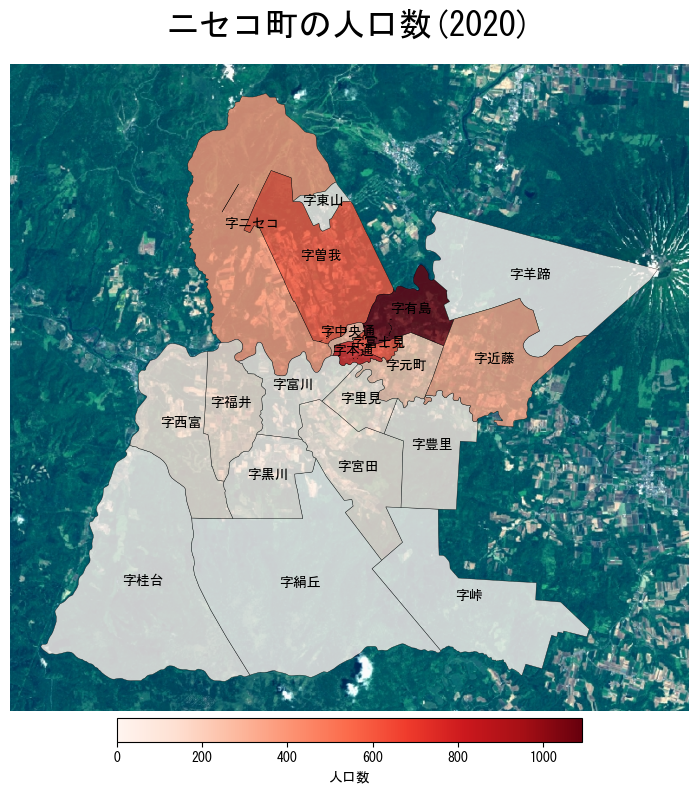

In [41]:
# population map
fig, ax = plt.subplots(figsize=(10,10))

nise.plot(ax=ax,
         column='JINKO',
         legend=True,
         cmap='Reds',
         edgecolor='black',
         linewidth=0.3,
         alpha=0.8,
         legend_kwds={'label': "人口数",'shrink': 0.6, 'orientation': "horizontal", 'pad': 0.01}
         )

# hide axes
ax.axis('off')

# Sort the dataframe by JINKO in descending order
nise_sorted = nise.sort_values('JINKO', ascending=False)

# Get the top 10 rows
top_10 = nise_sorted.head(20)

# Label the polygons with the top 10 highest JINKO values
for idx, row in top_10.iterrows():
    ax.annotate(row['S_NAME'], (row.geometry.centroid.x, row.geometry.centroid.y), color='black', fontsize=10, ha='center')

# title
ax.set_title('ニセコ町の人口数(2020)', fontsize=24,pad=20)

# Add the basemap
ctx.add_basemap(ax, source='https://cyberjapandata.gsi.go.jp/xyz/seamlessphoto/{z}/{x}/{y}.jpg')


In [44]:
nise.head()

,S_NAME,geometry,KEY_CODE,PREF,CITY,K_AREA,S_AREA,PREF_NAME,CITY_NAME,KIGO_E,...,KIGO_I,KEYCODE1,JINKO,SETAI,KEN_OLD,CITY_OLD,X_CODE,Y_CODE,KCODE1,CCODE1
0,字ニセコ,"POLYGON ((15659992.231 5282334.399, 15660005.4...",0139500211013950022301395002620139500272013950...,010101010101,395395395395395395,0180000100180000200180000300180000400180000500...,002110022300262002720028200292,北海道北海道北海道北海道北海道北海道,ニセコ町ニセコ町ニセコ町ニセコ町ニセコ町ニセコ町,0.0,...,0.0,3950021-1-003950022-3-003950026-2-003950027-2-...,392,208,010101010101,395395395395395395,843.878947,257.009745,0180-000100180-000200180-000300180-000400180-0...,21-122-326-227-228-229-2
1,字中央通,"POLYGON ((15661141.028 5282584.312, 15661083.0...",0139500011010139500011020139500011030139500011...,010101010101,395395395395395395,0030000100030000200030000300030000400030000500...,00011010001102000110300011040016100171,北海道北海道北海道北海道北海道北海道,ニセコ町ニセコ町ニセコ町ニセコ町ニセコ町ニセコ町,0.0,...,0.0,3950001-1-013950001-1-023950001-1-033950001-1-...,283,171,010101010101,395395395395395395,844.110364,256.849689,0030-000100030-000200030-000300030-000400030-0...,1-1- 11-1- 21-1- 31-1- 416-117-1
2,字元町,"POLYGON ((15664218.147 5279963.809, 15664194.4...",013950048101395004910139500501,010101,395395395,004000010004000020004000030,004810049100501,北海道北海道北海道,ニセコ町ニセコ町ニセコ町,0.0,...,0.0,3950048-1-003950049-1-003950050-1-00,244,140,010101,395395395,422.126122,128.395942,0040-000100040-000200040-00030,48-149-150-1
3,字宮田,"POLYGON ((15663276.298 5277520.832, 15663249.3...",013950046101013950046102013950047201,010101,395395395,011000010011000020011000030,004610100461020047201,北海道北海道北海道,ニセコ町ニセコ町ニセコ町,0.0,...,0.0,3950046-1-013950046-1-023950047-2-01,95,34,010101,395395395,422.070067,128.317692,0110-000100110-000200110-00030,46-1- 146-1- 247-2- 1
4,字富士見,"POLYGON ((15661331.711 5282151.699, 15661296.0...",0139500051010139500051020139500051030139500061...,010101010101010101,395395395395395395395395395,0020000100020000200020000300020000400020000500...,0005101000510200051030006101000610200101020010...,北海道北海道北海道北海道北海道北海道北海道北海道北海道,ニセコ町ニセコ町ニセコ町ニセコ町ニセコ町ニセコ町ニセコ町ニセコ町ニセコ町,0.0,...,0.0,3950005-1-013950005-1-023950005-1-033950006-1-...,629,299,010101010101010101,395395395395395395395395395,1266.223597,385.247832,0020-000100020-000200020-000300020-000400020-0...,5-1- 15-1- 25-1- 36-1- 16-1- 210-1- 210-1- 320...


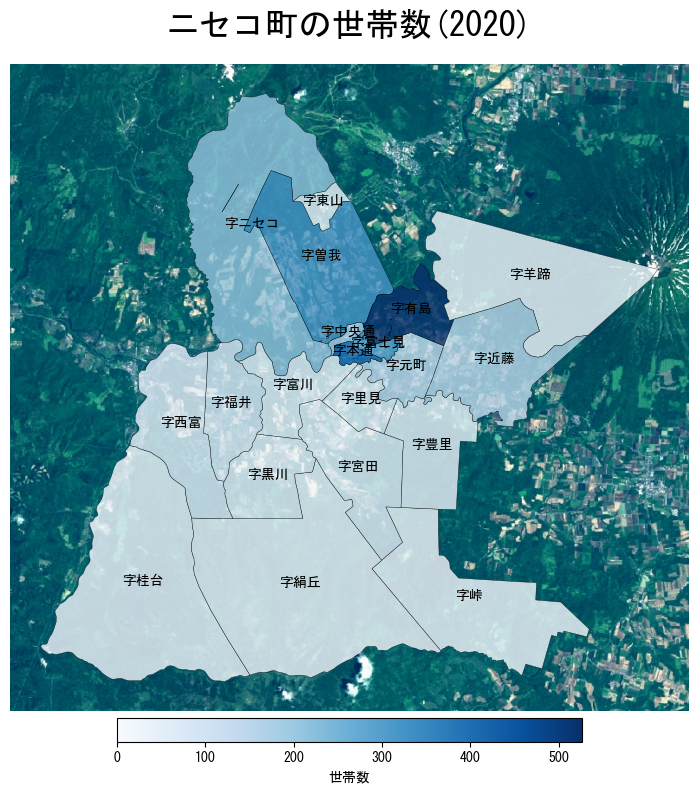

In [45]:
# population map
fig, ax = plt.subplots(figsize=(10,10))

nise.plot(ax=ax,
         column='SETAI',
         legend=True,
         cmap='Blues',
         edgecolor='black',
         linewidth=0.3,
         alpha=0.8,
         legend_kwds={'label': "世帯数",'shrink': 0.6, 'orientation': "horizontal", 'pad': 0.01}
         )

# hide axes
ax.axis('off')

# Sort the dataframe by JINKO in descending order
nise_sorted = nise.sort_values('SETAI', ascending=False)

# Get the top 10 rows
top_10 = nise_sorted.head(20)

# Label the polygons with the top 10 highest JINKO values
for idx, row in top_10.iterrows():
    ax.annotate(row['S_NAME'], (row.geometry.centroid.x, row.geometry.centroid.y), color='black', fontsize=10, ha='center')

# title
ax.set_title('ニセコ町の世帯数(2020)', fontsize=24,pad=20)

# Add the basemap
ctx.add_basemap(ax, source='https://cyberjapandata.gsi.go.jp/xyz/seamlessphoto/{z}/{x}/{y}.jpg')
